# Partie 1

# 1. Importation des packages et importer les données

In [1]:
# Import packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from scipy.stats import stats

## Importation des données

In [2]:
# Importation du dataframe
df = pd.read_csv('BankChurners.csv')

# Afficher les premières lignes du tableau
df.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0.000093,0.99991
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0.000057,0.99994
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0.000021,0.99998
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0.000134,0.99987
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0.000022,0.99998


In [3]:
# Analyse de la dimension de la base de données
df.shape

(10127, 23)

In [4]:
# Analyse de l'ensemble des variables de la base de données
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 23 columns):
 #   Column                                                                                                                              Non-Null Count  Dtype  
---  ------                                                                                                                              --------------  -----  
 0   CLIENTNUM                                                                                                                           10127 non-null  int64  
 1   Attrition_Flag                                                                                                                      10127 non-null  object 
 2   Customer_Age                                                                                                                        10127 non-null  int64  
 3   Gender                                                                           

|Nom de la variable | Définition |
| ------------------ | -------------------------------------------------------------------------------------------------------------- |
| CLIENTNUM | numéro du client |
| Attrition_Flag | Indicateur de départ du client (cible) |
| Customer_Age | age du client |
| Gender | genre |
| Dependent_count | nombre de personnes à charge |
| Education_Level | niveau d'éducation |
| Marital_Status | statut matrimonial |
| Income_Category | catégorie de revenu annuel du client |
| Card_Category | catégorie de carte |
| Months_on_book | nombre de mois depuis l’ouverture du compte |
| Total_Relationship_Count | nombre total de relations ou produits financiers que le client détient avec la banque |
| Months_Inactive_12_mon | mois d’inactivité sur les 12 derniers mois |
| Contacts_Count_12_mon | nombre de contacts sur 12 mois |
| Credit_Limit | limite de crédit accordée |
| Total_Revolving_Bal | solde total revolving du client ou montant total non payé et reporté |
| Avg_Open_To_Buy | montant moyen disponible sur la ligne de crédit |
| Total_Amt_Chng_Q4_Q1 | taux de variation du montant total des transactions par carte de crédit entre le 4e trimestre (Q4) et le 1er trimestre (Q1) |
| Total_Trans_Amt | montant total des transactions effectuées par le client sur une période donnée |
| Total_Trans_Ct | nombre total de transactions effectuées par un client au cours d'une période donnée |
| Total_Ct_Chng_Q4_Q1 | variation du nombre total de transactions entre le quatrième trimestre (Q4) et le premier trimestre (Q1) |
| Avg_Utilization_Ratio | ratio moyen d'utilisation du crédit disponible |
| Nb_churn_prob_1 | score de churn issu d’un modèle Naive Bayes (classe 1) |
| Nb_churn_prob_2 | score de churn issu d’un modèle Naive Bayes (classe 2) |

In [5]:
# Suppression des colonnes inutiles
# Les deux dernières colonnes sont issues d’un modèle Naive Bayes prédéfini, et CLIENTNUM est un identifiant inutile pour l'analyse
df_cleaned = df.drop(columns=[
    'CLIENTNUM',
    'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1',
    'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2'
])

# Statistiques sur les valeurs manquantes et "Unknown"
missing_values = df_cleaned.isna().sum()
unknown_values = df_cleaned.apply(lambda x: (x == "Unknown").sum())

missing_values, unknown_values

(Attrition_Flag              0
 Customer_Age                0
 Gender                      0
 Dependent_count             0
 Education_Level             0
 Marital_Status              0
 Income_Category             0
 Card_Category               0
 Months_on_book              0
 Total_Relationship_Count    0
 Months_Inactive_12_mon      0
 Contacts_Count_12_mon       0
 Credit_Limit                0
 Total_Revolving_Bal         0
 Avg_Open_To_Buy             0
 Total_Amt_Chng_Q4_Q1        0
 Total_Trans_Amt             0
 Total_Trans_Ct              0
 Total_Ct_Chng_Q4_Q1         0
 Avg_Utilization_Ratio       0
 dtype: int64,
 Attrition_Flag                 0
 Customer_Age                   0
 Gender                         0
 Dependent_count                0
 Education_Level             1519
 Marital_Status               749
 Income_Category             1112
 Card_Category                  0
 Months_on_book                 0
 Total_Relationship_Count       0
 Months_Inactive_12_mon  

In [ ]:
# Analyse du type de variable dans la base de données
print(df_cleaned.dtypes)

Attrition_Flag               object
Customer_Age                  int64
Gender                       object
Dependent_count               int64
Education_Level              object
Marital_Status               object
Income_Category              object
Card_Category                object
Months_on_book                int64
Total_Relationship_Count      int64
Months_Inactive_12_mon        int64
Contacts_Count_12_mon         int64
Credit_Limit                float64
Total_Revolving_Bal           int64
Avg_Open_To_Buy             float64
Total_Amt_Chng_Q4_Q1        float64
Total_Trans_Amt               int64
Total_Trans_Ct                int64
Total_Ct_Chng_Q4_Q1         float64
Avg_Utilization_Ratio       float64
dtype: object


In [ ]:
# Vérifier les doublons dans toutes les colonnes
duplicates = df_cleaned[df_cleaned.duplicated()]

# Afficher les doublons
print("Doublons trouvés :")
print(duplicates)

Doublons trouvés :
Empty DataFrame
Columns: [Attrition_Flag, Customer_Age, Gender, Dependent_count, Education_Level, Marital_Status, Income_Category, Card_Category, Months_on_book, Total_Relationship_Count, Months_Inactive_12_mon, Contacts_Count_12_mon, Credit_Limit, Total_Revolving_Bal, Avg_Open_To_Buy, Total_Amt_Chng_Q4_Q1, Total_Trans_Amt, Total_Trans_Ct, Total_Ct_Chng_Q4_Q1, Avg_Utilization_Ratio]
Index: []


In [ ]:
# Calcul de l'effectif
eff_Education_Level = df_cleaned['Education_Level'].value_counts()

# Calcul de la proportion
proportions_eff_Education_Level = eff_Education_Level / len(df_cleaned)

# Création d'un dataframe avec les effectifs et proportions
Education_Level_df = pd.concat([eff_Education_Level, proportions_eff_Education_Level], axis=1)
Education_Level_df.columns = ['Effectif', 'Proportion']

# Tri des variables par ordre décroissant de proportion de valeurs manquantes
Education_Level_df = Education_Level_df.sort_values('Proportion', ascending=False)

# Affichage du tableau
Education_Level_df

,Effectif,Proportion
Education_Level,,
Graduate,3128,0.308877
High School,2013,0.198776
Unknown,1519,0.149995
Uneducated,1487,0.146835
College,1013,0.100030
Post-Graduate,516,0.050953
Doctorate,451,0.044534


In [ ]:
# Calcul de l'effectif
eff_Income_Category = df_cleaned['Income_Category'].value_counts()

# Calcul de la proportion
proportions_eff_Income_Category = eff_Income_Category / len(df_cleaned)

# Création d'un dataframe avec les effectifs et proportions
Income_Category_df = pd.concat([eff_Income_Category, proportions_eff_Income_Category], axis=1)
Income_Category_df.columns = ['Effectif', 'Proportion']

# Tri des variables par ordre décroissant de proportion de valeurs manquantes
Income_Category_df = Income_Category_df.sort_values('Proportion', ascending=False)

# Affichage du tableau
Income_Category_df

,Effectif,Proportion
Income_Category,,
Less than $40K,3561,0.351634
$40K - $60K,1790,0.176755
$80K - $120K,1535,0.151575
$60K - $80K,1402,0.138442
Unknown,1112,0.109805
$120K +,727,0.071788


In [ ]:
# Calcul de l'effectif
eff_Marital_Status = df_cleaned['Marital_Status'].value_counts()

# Calcul de la proportion
proportions_Marital_Status = eff_Marital_Status / len(df_cleaned)

# Création d'un dataframe avec les effectifs et proportions
Marital_Status_df = pd.concat([eff_Marital_Status, proportions_Marital_Status], axis=1)
Marital_Status_df.columns = ['Effectif', 'Proportion']

# Tri des variables par ordre décroissant de proportion de valeurs manquantes
Marital_Status_df = Marital_Status_df.sort_values('Proportion', ascending=False)

# Affichage du tableau
Marital_Status_df

,Effectif,Proportion
Marital_Status,,
Married,4687,0.462822
Single,3943,0.389355
Unknown,749,0.073961
Divorced,748,0.073862


In [ ]:
#df['Gender_enc'] = df['Gender'].map({'H': 0, 'F': 1})

# Calcul de l'effectif
eff_Gender = df_cleaned['Gender'].value_counts()

# Calcul de la proportion
proportions_Gender = eff_Gender / len(df_cleaned)

# Création d'un dataframe avec les effectifs et proportions
Gender_df = pd.concat([eff_Gender, proportions_Gender], axis=1)
Gender_df.columns = ['Effectif', 'Proportion']

# Tri des variables par ordre décroissant de proportion de valeurs manquantes
Gender_df = Gender_df.sort_values('Proportion', ascending=False)

# Affichage du tableau
Gender_df

,Effectif,Proportion
Gender,,
F,5358,0.529081
M,4769,0.470919


In [ ]:
# Calcul de l'effectif
eff_Attrition_Flag = df_cleaned['Attrition_Flag'].value_counts()

# Calcul de la proportion
proportions_Attrition_Flag = eff_Attrition_Flag / len(df_cleaned)

# Création d'un dataframe avec les effectifs et proportions
Attrition_Flag_df = pd.concat([eff_Attrition_Flag, proportions_Attrition_Flag], axis=1)
Attrition_Flag_df.columns = ['Effectif', 'Proportion']

# Tri des variables par ordre décroissant de proportion de valeurs manquantes
Attrition_Flag_df = Attrition_Flag_df.sort_values('Proportion', ascending=False)

# Affichage du tableau
Attrition_Flag_df

,Effectif,Proportion
Attrition_Flag,,
Existing Customer,8500,0.83934
Attrited Customer,1627,0.16066


In [ ]:
# Calcul de l'effectif
eff_Card_Category = df_cleaned['Card_Category'].value_counts()

# Calcul de la proportion
proportions_Card_Category = eff_Card_Category / len(df_cleaned)

# Création d'un dataframe avec les effectifs et proportions
Card_Category_df = pd.concat([eff_Card_Category, proportions_Card_Category], axis=1)
Card_Category_df.columns = ['Effectif', 'Proportion']

# Tri des variables par ordre décroissant de proportion de valeurs manquantes
Card_Category_df = Card_Category_df.sort_values('Proportion', ascending=False)

# Affichage du tableau
Card_Category_df

,Effectif,Proportion
Card_Category,,
Blue,9436,0.931767
Silver,555,0.054804
Gold,116,0.011455
Platinum,20,0.001975


In [ ]:
# Transformer les valeurs de la variables 'Attrition_Flag' en valeurs numériques
#df_cleaned['Attrition_Flag'] = df_cleaned['Attrition_Flag'].map({'Existing Customer': 0, 'Attrited Customer': 1})

In [ ]:
# Définir les variables numériques et catégoriques
numerics_features = [feature for feature in df_cleaned.columns if df_cleaned[feature].dtype != 'O']
categoricals_features = [feature for feature in df_cleaned.columns if df_cleaned[feature].dtype == 'O']

# Afficher les colonnes
print("Nous avons {} colonnes numériques : {}".format(len(numerics_features), numerics_features))
print("Nous avons {} colonnes categoriques : {}".format(len(categoricals_features), categoricals_features))

Nous avons 14 colonnes numériques : ['Customer_Age', 'Dependent_count', 'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']
Nous avons 6 colonnes categoriques : ['Attrition_Flag', 'Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category']


## Analyse des données manquantes

In [ ]:
# Remplacer "Unknown" par NaN
df_cleaned.replace("Unknown", np.nan, inplace=True)

In [ ]:
# Analyse des données manquantes
print(df_cleaned.isnull().sum())

Attrition_Flag                 0
Customer_Age                   0
Gender                         0
Dependent_count                0
Education_Level             1519
Marital_Status               749
Income_Category             1112
Card_Category                  0
Months_on_book                 0
Total_Relationship_Count       0
Months_Inactive_12_mon         0
Contacts_Count_12_mon          0
Credit_Limit                   0
Total_Revolving_Bal            0
Avg_Open_To_Buy                0
Total_Amt_Chng_Q4_Q1           0
Total_Trans_Amt                0
Total_Trans_Ct                 0
Total_Ct_Chng_Q4_Q1            0
Avg_Utilization_Ratio          0
dtype: int64


<Axes: >

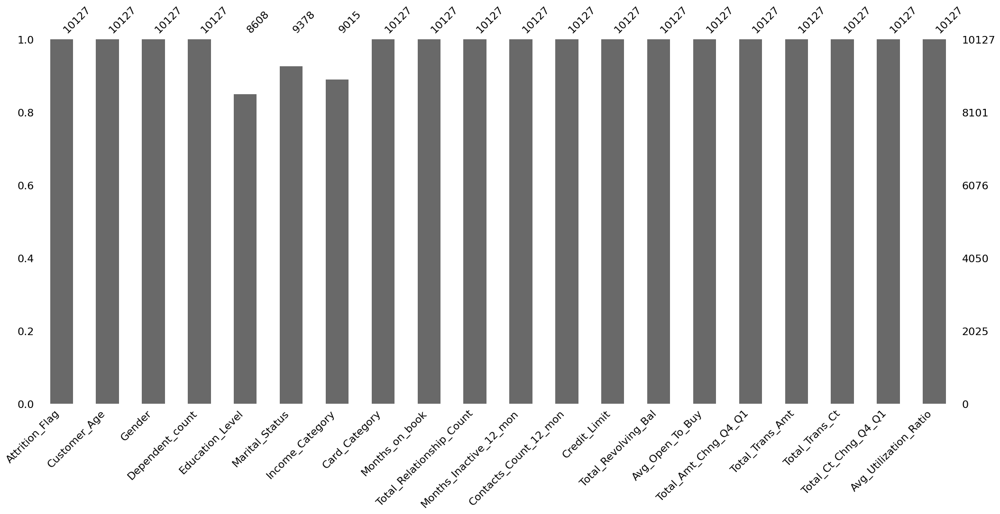

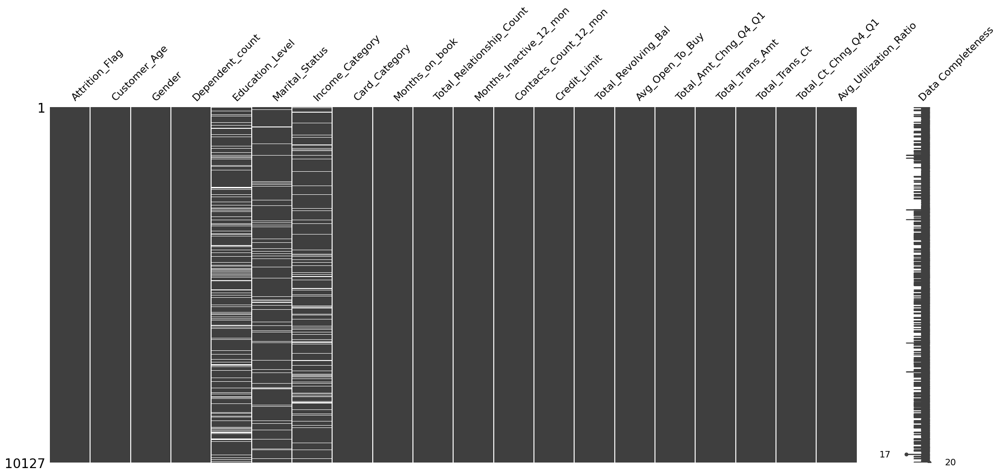

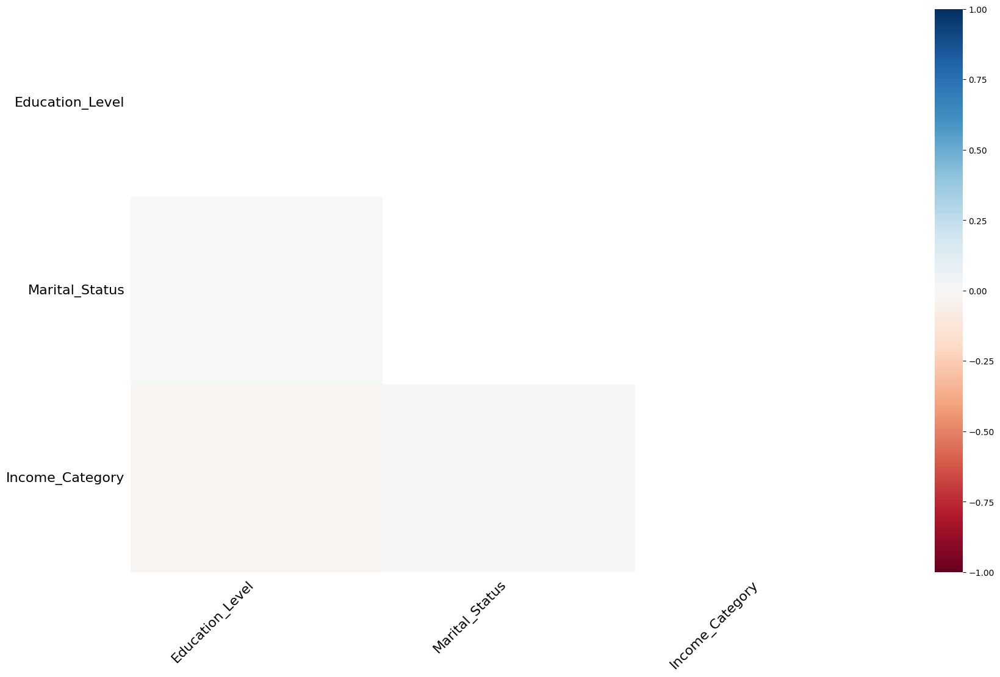

In [ ]:
#!pip install missingno
import missingno as msno
# Affichage des valeurs manquantes sous forme de matrice
msno.bar(df_cleaned)
msno.matrix(df_cleaned,labels=True)
msno.heatmap(df_cleaned)

In [ ]:
# Calcul du nombre de valeurs manquantes pour chaque variable
missing_values = df_cleaned.isnull().sum()

# Calcul de la proportion de valeurs manquantes pour chaque variable
missing_proportions = missing_values / len(df_cleaned)

# Création d'un dataframe avec les nombres et proportions de valeurs manquantes
missing_df = pd.concat([missing_values, missing_proportions], axis=1)
missing_df.columns = ['Nombre de valeurs manquantes', 'Proportion de valeurs manquantes']

# Tri des variables par ordre décroissant de proportion de valeurs manquantes
missing_df = missing_df.sort_values('Proportion de valeurs manquantes', ascending=False)

# Affichage du tableau
missing_df

,Nombre de valeurs manquantes,Proportion de valeurs manquantes
Education_Level,1519,0.149995
Income_Category,1112,0.109805
Marital_Status,749,0.073961
Attrition_Flag,0,0.000000
Dependent_count,0,0.000000
Gender,0,0.000000
Customer_Age,0,0.000000
Card_Category,0,0.000000
Months_on_book,0,0.000000
Total_Relationship_Count,0,0.000000


In [ ]:
# Calculer le mode de la variable "Education_Level"
mode_valeur1 = df_cleaned['Education_Level'].mode()[0]
mode_valeur1

'Graduate'

In [ ]:
# Remplacer les valeurs manquantes par le mode
df_cleaned['Education_Level'].fillna(mode_valeur1, inplace=True)

In [ ]:
# Calculer le mode de la variable "Income_Category"
mode_valeur2 = df_cleaned['Income_Category'].mode()[0]
mode_valeur2

'Less than $40K'

In [ ]:
# Remplacer les valeurs manquantes par le mode
df_cleaned['Income_Category'].fillna(mode_valeur2, inplace=True)

In [ ]:
# Calculer le mode de la variable "Marital_Status"
mode_valeur3 = df_cleaned['Marital_Status'].mode()[0]
mode_valeur3

'Married'

In [ ]:
# Remplacer les valeurs manquantes par le mode
df_cleaned['Marital_Status'].fillna(mode_valeur3, inplace=True)

In [ ]:
# Calcul du nombre de valeurs manquantes pour chaque variable
missing_values = df_cleaned.isnull().sum()

# Calcul de la proportion de valeurs manquantes pour chaque variable
missing_proportions = missing_values / len(df)

# Création d'un dataframe avec les nombres et proportions de valeurs manquantes
missing_df = pd.concat([missing_values, missing_proportions], axis=1)
missing_df.columns = ['Nombre de valeurs manquantes', 'Proportion de valeurs manquantes']

# Tri des variables par ordre décroissant de proportion de valeurs manquantes
missing_df = missing_df.sort_values('Proportion de valeurs manquantes', ascending=False)

# Affichage du tableau
missing_df

,Nombre de valeurs manquantes,Proportion de valeurs manquantes
Attrition_Flag,0,0.0
Customer_Age,0,0.0
Gender,0,0.0
Dependent_count,0,0.0
Education_Level,0,0.0
Marital_Status,0,0.0
Income_Category,0,0.0
Card_Category,0,0.0
Months_on_book,0,0.0
Total_Relationship_Count,0,0.0


In [ ]:
# Afficher les valeurs uniques des variables catégoriques
cat_cols = df_cleaned.select_dtypes(include='object').columns
for col in cat_cols:
    print(f"{col} : {df_cleaned[col].unique()}")

Attrition_Flag : ['Existing Customer' 'Attrited Customer']
Gender : ['M' 'F']
Education_Level : ['High School' 'Graduate' 'Uneducated' 'College' 'Post-Graduate'
 'Doctorate']
Marital_Status : ['Married' 'Single' 'Divorced']
Income_Category : ['$60K - $80K' 'Less than $40K' '$80K - $120K' '$40K - $60K' '$120K +']
Card_Category : ['Blue' 'Gold' 'Silver' 'Platinum']


# 2. Analyses descriptives univariées

In [ ]:
# Analyse desciptive du jeu de données
description = df_cleaned.describe().T
description

,count,mean,std,min,25%,50%,75%,max
Customer_Age,10127.0,46.325960,8.016814,26.0,41.000,46.000,52.000,73.000
Dependent_count,10127.0,2.346203,1.298908,0.0,1.000,2.000,3.000,5.000
Months_on_book,10127.0,35.928409,7.986416,13.0,31.000,36.000,40.000,56.000
Total_Relationship_Count,10127.0,3.812580,1.554408,1.0,3.000,4.000,5.000,6.000
Months_Inactive_12_mon,10127.0,2.341167,1.010622,0.0,2.000,2.000,3.000,6.000
Contacts_Count_12_mon,10127.0,2.455317,1.106225,0.0,2.000,2.000,3.000,6.000
Credit_Limit,10127.0,8631.953698,9088.776650,1438.3,2555.000,4549.000,11067.500,34516.000
Total_Revolving_Bal,10127.0,1162.814061,814.987335,0.0,359.000,1276.000,1784.000,2517.000
Avg_Open_To_Buy,10127.0,7469.139637,9090.685324,3.0,1324.500,3474.000,9859.000,34516.000
Total_Amt_Chng_Q4_Q1,10127.0,0.759941,0.219207,0.0,0.631,0.736,0.859,3.397


In [ ]:
# Description des variables qualitatives
df_cleaned.describe(include="object").T

,count,unique,top,freq
Attrition_Flag,10127,2,Existing Customer,8500
Gender,10127,2,F,5358
Education_Level,10127,6,Graduate,4647
Marital_Status,10127,3,Married,5436
Income_Category,10127,5,Less than $40K,4673
Card_Category,10127,4,Blue,9436


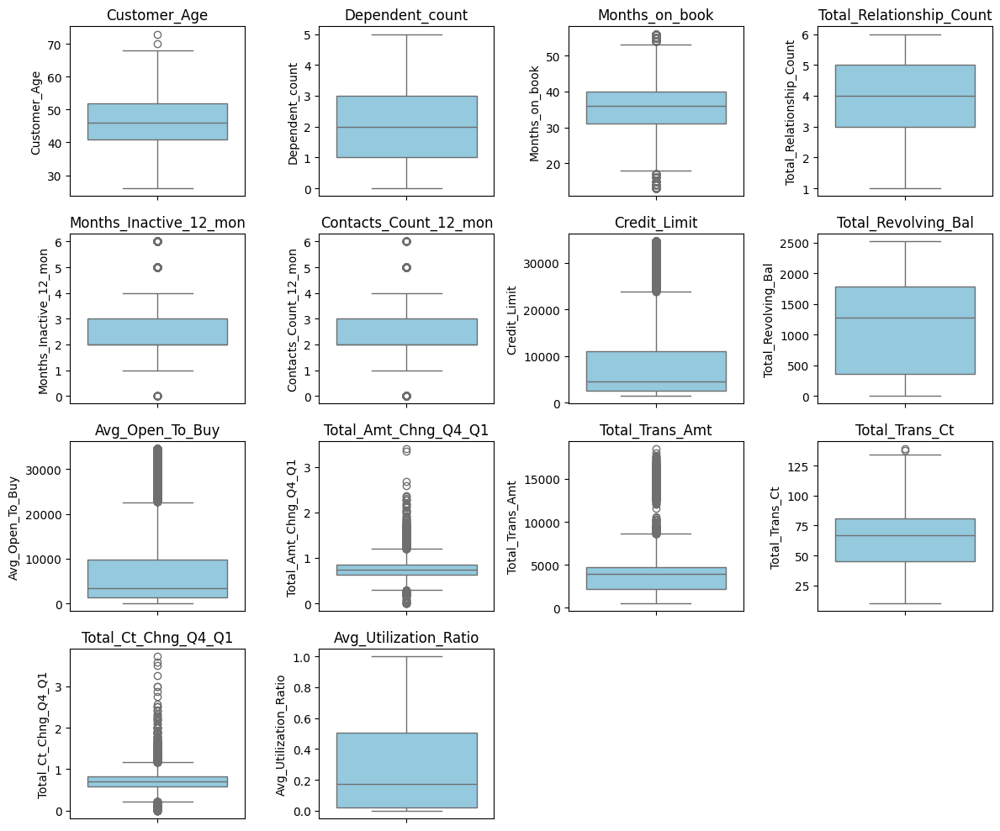

In [ ]:
# Analyse descriptive des variables quantitatives

# Sélection des variables quantitatives
quant_vars = df_cleaned.select_dtypes(include=['float64', 'int64'])

# Tracé des boxplots pour chaque variable quantitative avec Seaborn
plt.figure(figsize=(12, 10))
for i, var in enumerate(quant_vars):
    plt.subplot(4, 4, i+1)
    sns.boxplot(y=df_cleaned[var], color='skyblue')
    plt.title(var)
plt.tight_layout()
plt.show()

## Détection des outliers (par IQR)

In [ ]:
'''
# Calcul des quartiles
Q1 = df_cleaned['Customer_Age'].quantile(0.25)
Q3 = df_cleaned['Customer_Age'].quantile(0.75)
IQR = Q3 - Q1

# Bornes de détection
borne_basse = Q1 - 1.5 * IQR
borne_haute = Q3 + 1.5 * IQR

# Filtrage des valeurs aberrantes
outliers = df_cleaned[(df_cleaned['Customer_Age'] < borne_basse) | (df_cleaned['Customer_Age'] > borne_haute)]
print("Outliers détectés :")
print(outliers)
'''

## Remplacer les outliers par la médiane — Toutes les colonnes numériques

In [ ]:
def remplacer_outliers_par_mediane(df_cleaned):
    df_clean = df_cleaned.copy()
    colonnes_numeriques = df_cleaned.select_dtypes(include=['float64', 'int64']).columns

    for col in colonnes_numeriques:
        Q1 = df_clean[col].quantile(0.25)
        Q3 = df_clean[col].quantile(0.75)
        IQR = Q3 - Q1

        borne_basse = Q1 - 1.5 * IQR
        borne_haute = Q3 + 1.5 * IQR

        mediane = df_clean[col].median()

        # Remplacement des outliers
        df_clean[col] = df_clean[col].apply(lambda x: mediane if x < borne_basse or x > borne_haute else x)

    return df_clean

In [ ]:
df_corrige = remplacer_outliers_par_mediane(df_cleaned)

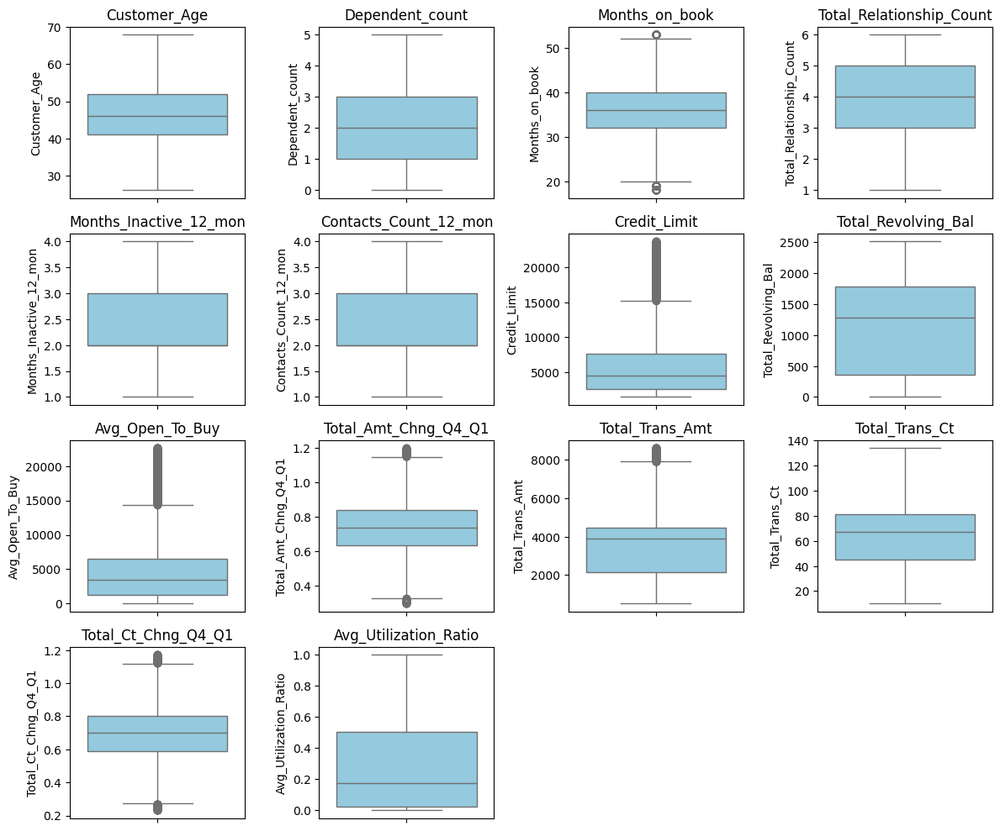

In [ ]:
# Analyse descriptive des variables quantitatives corrigées

# Sélection des variables quantitatives
quant_vars = df_corrige.select_dtypes(include=['float64', 'int64'])

# Tracé des boxplots pour chaque variable quantitative avec Seaborn
plt.figure(figsize=(12, 10))
for i, var in enumerate(quant_vars):
    plt.subplot(4, 4, i+1)
    sns.boxplot(y=df_corrige[var], color='skyblue')
    plt.title(var)
plt.tight_layout()
plt.show()

In [ ]:
'''
# Analyse de la normalité
from scipy.stats import shapiro

# Création d'un histogramme et d'un test de normalité pour chaque variable
for column in quant_vars:
    plt.figure(figsize=(8, 6))
    sns.histplot(data=df, x=column, kde=True)
    plt.title(f"Histogramme de la variable {column}")
    plt.show()
'''

In [ ]:
'''
# Initialisation du DataFrame pour les résultats des tests de normalité
normality_df = pd.DataFrame(columns=['Variable', 'P-value', 'Normality'])

# Boucle pour calculer les tests de normalité pour chaque variable
for var in quant_vars:
    stat, p = shapiro(quant_vars[var])
    normality = 'Normal' if p > 0.05 else 'Not Normal'
    #normality_df = normality_df.append({'Variable': var, 'P-value': p, 'Normality': normality}, ignore_index=True)
    normality_df = pd.concat([normality_df, pd.DataFrame([{'Variable': var, 'P-value': p, 'Normality': normality}])], ignore_index=True)
# Affichage du DataFrame des résultats des tests de normalité
normality_df
'''

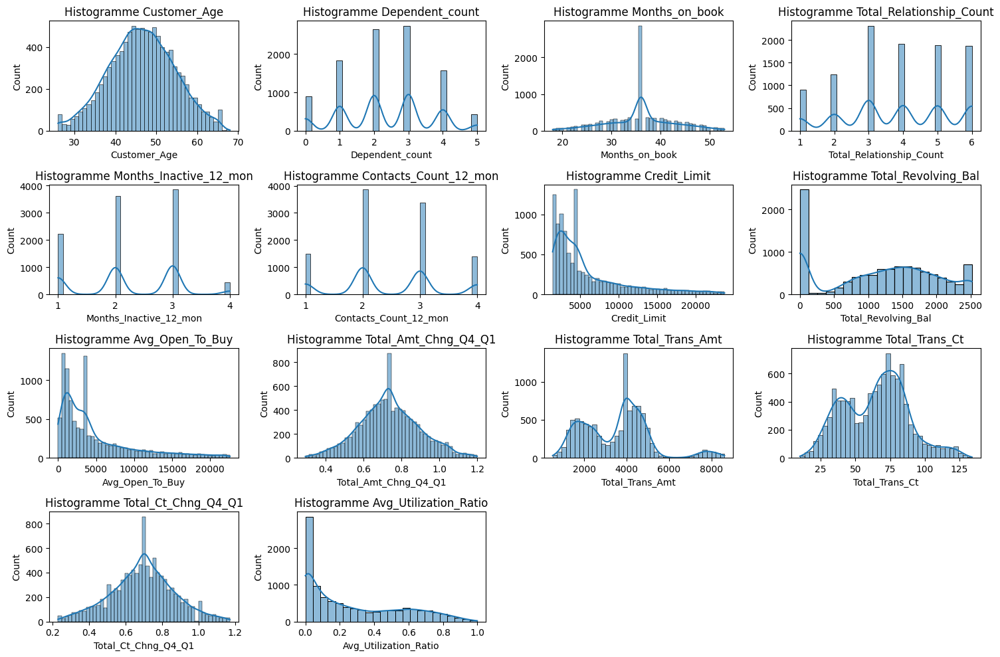

In [ ]:
from scipy.stats import normaltest

# Analyse de la normalité

# Création d'un histogramme et d'un test de normalité pour chaque variable
#for column in df_corrige.select_dtypes(include=['float64', 'int64']).columns: # Filtre sur les colonnes numériques uniquement
plt.figure(figsize=(15,10))
for i, column in enumerate(quant_vars):
  plt.subplot(4, 4, i+1)
  sns.histplot(data=df_corrige, x=column, kde=True)
  plt.title(f"Histogramme {column}")
  #plt.title(f"Histogramme de la variable {column}")
  #plt.show()
plt.tight_layout()
plt.show()

  #statistic, p_value = stats.normaltest(df_corrige[column])
  #if p_value < 0.05:
  #  print(f"La variable {column} ne suit pas une loi normale (p-value={p_value})")
  #else:
  #  print(f"La variable {column} suit une loi normale (p-value={p_value})")

In [ ]:
# Initialisation du DataFrame pour les résultats des tests de normalité
normality_df = pd.DataFrame(columns=['Variable', 'P-value', 'Normality'])

# Boucle pour calculer les tests de normalité pour chaque variable
for var in quant_vars:
    stat, p = normaltest(quant_vars[var])
    normality = 'Normal' if p > 0.05 else 'Not Normal'
    #normality_df = normality_df.append({'Variable': var, 'P-value': p, 'Normality': normality}, ignore_index=True)
    normality_df = pd.concat([normality_df, pd.DataFrame([{'Variable': var, 'P-value': p, 'Normality': normality}])], ignore_index=True)
# Affichage du DataFrame des résultats des tests de normalité
normality_df

<ipython-input-46-462818ab88f7>:9: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  normality_df = pd.concat([normality_df, pd.DataFrame([{'Variable': var, 'P-value': p, 'Normality': normality}])], ignore_index=True)


,Variable,P-value,Normality
0,Customer_Age,1.597450e-12,Not Normal
1,Dependent_count,9.861413e-108,Not Normal
2,Months_on_book,4.218886e-03,Not Normal
3,Total_Relationship_Count,0.000000e+00,Not Normal
4,Months_Inactive_12_mon,1.417780e-310,Not Normal
5,Contacts_Count_12_mon,1.341289e-171,Not Normal
6,Credit_Limit,0.000000e+00,Not Normal
7,Total_Revolving_Bal,0.000000e+00,Not Normal
8,Avg_Open_To_Buy,0.000000e+00,Not Normal
9,Total_Amt_Chng_Q4_Q1,8.120641e-06,Not Normal


<ipython-input-47-899dd86d68cd>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=var, data=df_cleaned, palette='pastel') # Create the countplot and assign it to ax
<ipython-input-47-899dd86d68cd>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=var, data=df_cleaned, palette='pastel') # Create the countplot and assign it to ax
<ipython-input-47-899dd86d68cd>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=var, data=df_cleaned, palette='pastel') # Create the countplot and assign it to ax
<ipython-input-47-899dd86

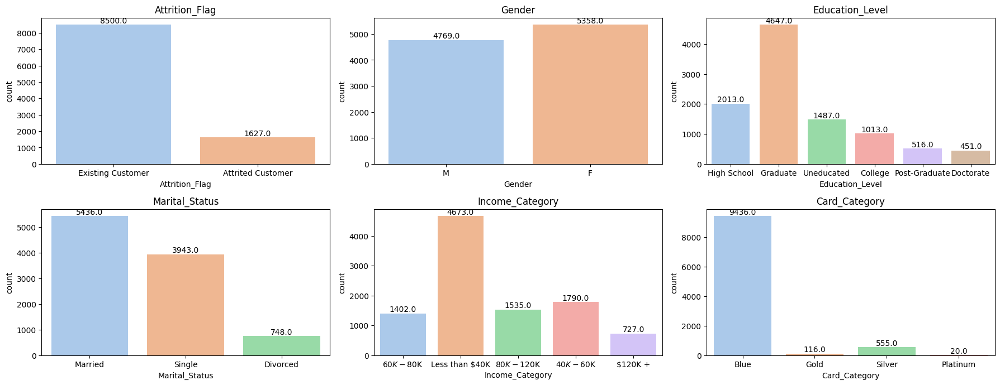

'\n# Création du countplot\nax = sns.countplot(x=\'Attrition_Flag\', data=df_cleaned, palette=\'coolwarm\')\n\n# Ajout des effectifs sur les barres\nfor p in ax.patches:\n    height = p.get_height()\n    ax.annotate(f\'{height}\',\n                (p.get_x() + p.get_width() / 2., height),\n                ha=\'center\', va=\'bottom\')\n\n# Affichage du graphique\nplt.title("Répartition par attrition du client")\nplt.xlabel("Indicateur de départ du client")\nplt.ylabel("Effectif")\nplt.show()\n'

In [ ]:
# Analyse des variables qualitatives "Attrition_Flag"
#sns.countplot(x=df_cleaned['Attrition_Flag'])
#sns.countplot(x='Attrition_Flag', data=df_cleaned, palette='coolwarm')
# Tableaux de fréquence pour les variables catégorielles
categorical_vars = ["Attrition_Flag", "Gender", "Education_Level", "Marital_Status", "Income_Category", "Card_Category"]

# Histogrammes pour les variables catégorielles
plt.figure(figsize=(18, 10))

for i, var in enumerate(categorical_vars):
    plt.subplot(3, 3, i+1)
    ax = sns.countplot(x=var, data=df_cleaned, palette='pastel') # Create the countplot and assign it to ax
    plt.title(var)

    # Iterate over the patches (bars) in the countplot
    for p in ax.patches:
        height = p.get_height()
        ax.annotate(f'{height}',
                    (p.get_x() + p.get_width() / 2., height),
                    ha='center', va='bottom')

plt.tight_layout()
plt.show()

'''
# Création du countplot
ax = sns.countplot(x='Attrition_Flag', data=df_cleaned, palette='coolwarm')

# Ajout des effectifs sur les barres
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height}',
                (p.get_x() + p.get_width() / 2., height),
                ha='center', va='bottom')

# Affichage du graphique
plt.title("Répartition par attrition du client")
plt.xlabel("Indicateur de départ du client")
plt.ylabel("Effectif")
plt.show()
'''

# 3. Analyses descriptives bivariées

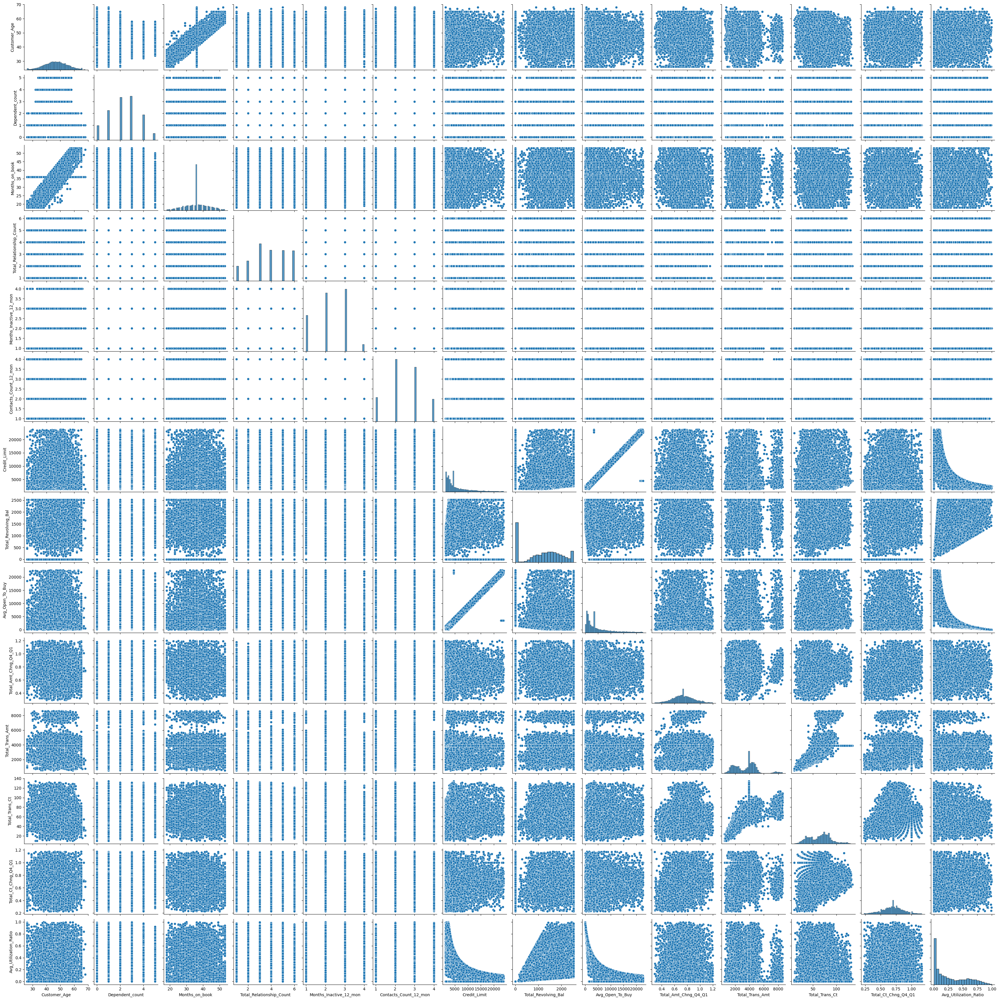

In [ ]:
# Relation entre les variables quantitatives
sns.pairplot(df_corrige[quant_vars.columns])

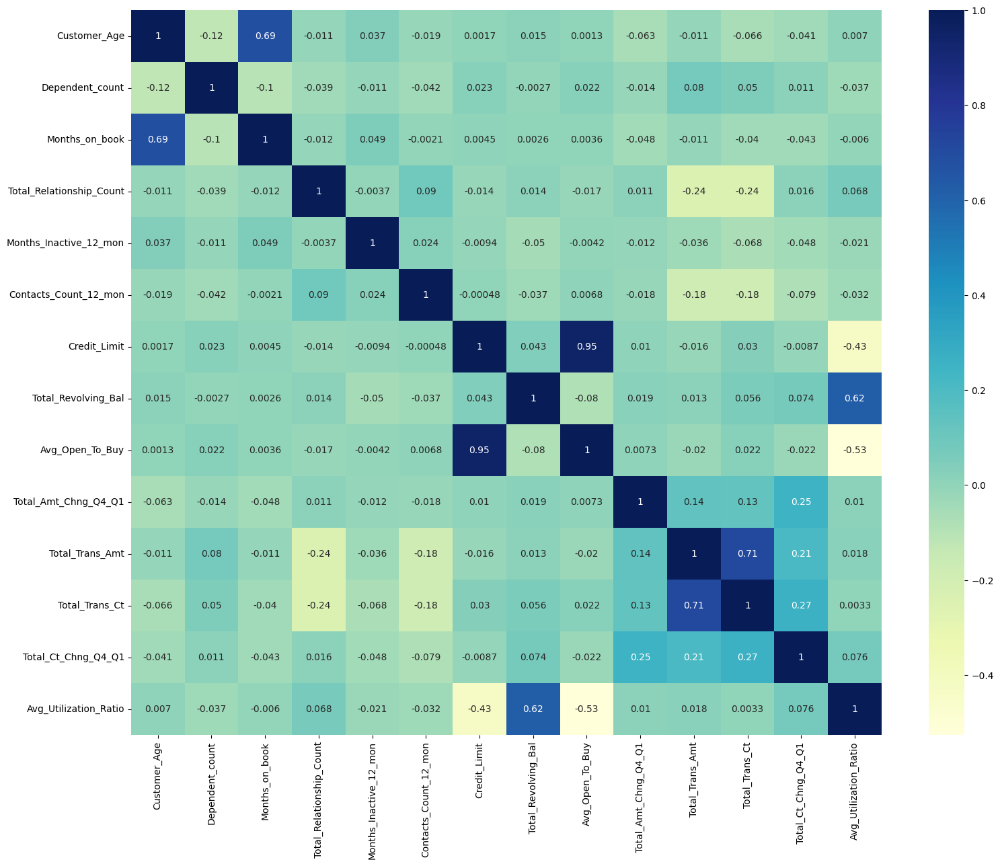

In [ ]:
# Obtenir le tableau de corélation et la heatmap (corrélation de pearson)
corr_matrix = quant_vars.corr()

# Calcul des p-values pour chaque paire de variables
fig, ax = plt.subplots(figsize=(18,14))
sns.heatmap(corr_matrix,annot=True,cmap="YlGnBu")
plt.show()

In [ ]:
df=df_corrige

In [ ]:
# Selection des variables pertinentes
perti_vars = ["Total_Relationship_Count","Months_Inactive_12_mon", "Contacts_Count_12_mon", "Total_Revolving_Bal", "Total_Trans_Amt","Total_Trans_Ct",
"Gender","Income_Category","Education_Level","Attrition_Flag"]

# Selection des variables pertinentes
selected_data = df[perti_vars]

# Conversion de la variable "Attrition_Flag" en  variables num´eriques
df_Attrition_Flag = pd.DataFrame(selected_data['Attrition_Flag'].apply(lambda x: 1 if x.startswith("Attrited Customer") else 0))
selected_data = pd.concat([selected_data.drop('Attrition_Flag',axis=1), df_Attrition_Flag],axis=1)
selected_data

,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Total_Revolving_Bal,Total_Trans_Amt,Total_Trans_Ct,Gender,Income_Category,Education_Level,Attrition_Flag
0,5,1.0,3.0,777,1144.0,42.0,M,$60K - $80K,High School,0
1,6,1.0,2.0,864,1291.0,33.0,F,Less than $40K,Graduate,0
2,4,1.0,2.0,0,1887.0,20.0,M,$80K - $120K,Graduate,0
3,3,4.0,1.0,2517,1171.0,20.0,F,Less than $40K,High School,0
4,5,1.0,2.0,0,816.0,28.0,M,$60K - $80K,Uneducated,0
...,...,...,...,...,...,...,...,...,...,...
10122,3,2.0,3.0,1851,3899.0,117.0,M,$40K - $60K,Graduate,0
10123,4,2.0,3.0,2186,3899.0,69.0,M,$40K - $60K,Graduate,1
10124,5,3.0,4.0,0,3899.0,60.0,F,Less than $40K,High School,1
10125,4,3.0,3.0,0,8395.0,62.0,M,$40K - $60K,Graduate,1


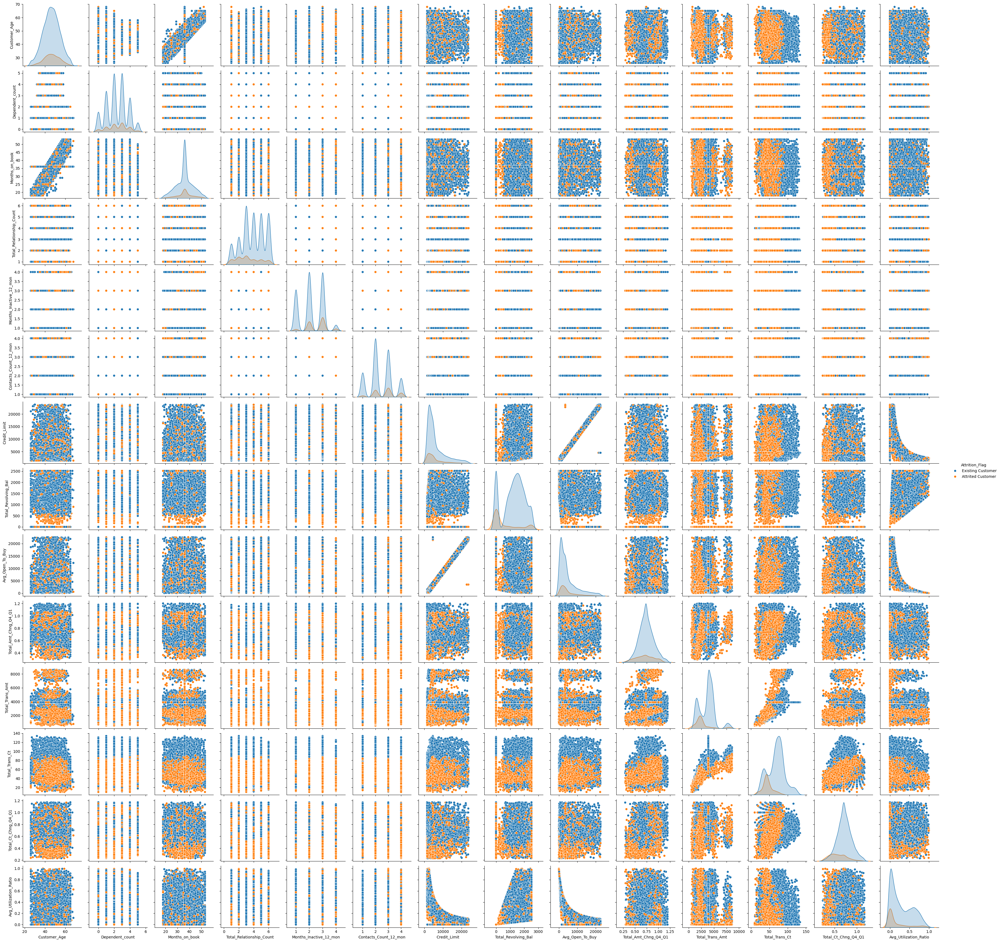

In [ ]:
sns.pairplot(df_corrige, hue='Attrition_Flag')

In [ ]:
import numpy as np

# Liste des noms de colonnes pour lesquelles nous voulons sélectionner les valeurs numériques
colonnes_numeriques = ["Total_Relationship_Count","Months_Inactive_12_mon", "Contacts_Count_12_mon", "Total_Revolving_Bal", "Total_Trans_Amt","Total_Trans_Ct","Credit_Limit","Months_on_book"]

# Sélectionner les colonnes spécifiées avec les valeurs numériques
Data_ACP= df_corrige[colonnes_numeriques]

# Afficher les premières lignes pour vérifier la structure des données
print(Data_ACP.head())

   Total_Relationship_Count  Months_Inactive_12_mon  Contacts_Count_12_mon  \
0                         5                     1.0                    3.0   
1                         6                     1.0                    2.0   
2                         4                     1.0                    2.0   
3                         3                     4.0                    1.0   
4                         5                     1.0                    2.0   

   Total_Revolving_Bal  Total_Trans_Amt  Total_Trans_Ct  Credit_Limit  \
0                  777           1144.0            42.0       12691.0   
1                  864           1291.0            33.0        8256.0   
2                    0           1887.0            20.0        3418.0   
3                 2517           1171.0            20.0        3313.0   
4                    0            816.0            28.0        4716.0   

   Months_on_book  
0            39.0  
1            44.0  
2            36.0  
3           

# 4. Analyse multivariée avec l'ACP

## Construction de l'ACP

## Aide à l'interprétation

### Choix du nombre d'axe

In [ ]:
# Standardisation des données
# Normaliser les données
# Créer un objet scaler de la classe StandardScaler

scaler = StandardScaler()

# Utiliser la méthode fit_transform() sur l'objet scaler pour normaliser les données

data_scaled = scaler.fit_transform(Data_ACP);

# Réduction de dimension

from sklearn.decomposition import PCA
pca = PCA()
data_pca=pca.fit_transform(data_scaled);

# La détermination du nombre d'axes principaux

# Analyse des valeurs propres

comp = pd.DataFrame(

    { "Dimension": ["Dim" + str(i + 1) for i in range(pca.n_components_)],
        "Valeur propre": pca.explained_variance_,
        "% variance expliquée": np.round(pca.explained_variance_ratio_ * 100),
        "% cum. var. expliquée": np.round(np.cumsum(pca.explained_variance_ratio_) * 100)

    }

)
print(comp);


  Dimension  Valeur propre  % variance expliquée  % cum. var. expliquée
0      Dim1       1.935518                  24.0                   24.0
1      Dim2       1.082914                  14.0                   38.0
2      Dim3       1.031855                  13.0                   51.0
3      Dim4       0.976525                  12.0                   63.0
4      Dim5       0.930316                  12.0                   74.0
5      Dim6       0.909930                  11.0                   86.0
6      Dim7       0.846546                  11.0                   96.0
7      Dim8       0.287186                   4.0                  100.0


<ipython-input-54-00d7908bd255>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  g_comp = sns.barplot(x = "Dimension",
<ipython-input-54-00d7908bd255>:2: UserWarning: 
The palette list has fewer values (1) than needed (8) and will cycle, which may produce an uninterpretable plot.
  g_comp = sns.barplot(x = "Dimension",


Text(3.25, 12, '12%')

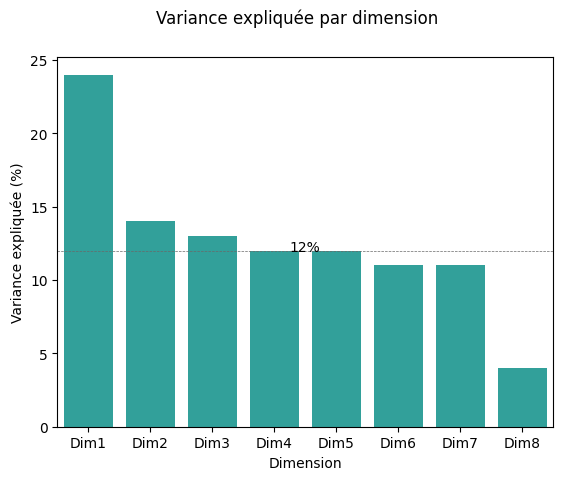

In [ ]:
# Barplot pour choisir le nombre de composantes principales
g_comp = sns.barplot(x = "Dimension",
                y = "% variance expliquée",
                palette = ["lightseagreen"],
                data = comp)
g_comp.set(ylabel = "Variance expliquée (%)")
g_comp.figure.suptitle("Variance expliquée par dimension")
plt.axhline(y = 12, linewidth = .5, color = "dimgray", linestyle = "--") # 12 = 100 / 8 (nb dimensions)
plt.text(3.25, 12, "12%")

### Autres aide à l'interprétation

##### Qualité de représentation des variables et contribution à la formation des axes

Lors de l'analyse en composantes principales (ACP), il est important de mesurer la qualité de représentation des variables sur les axes principaux et leur contribution à la formation de ces axes.

**Qualité de représentation des variables (cosinus carré)**

La qualité de représentation des variables est souvent mesurée à l'aide du carré du cosinus de l'angle entre les vecteurs représentant les variables et les axes principaux. Le cosinus carré est également appelé **cos2**. Pour une variable donnée, la somme des cos2 sur tous les axes principaux est égale à 1.

La formule pour calculer le cos2 pour une variable `i` sur un axe principal `k` est la suivante :

$$
\text{cos}^2(i, k) = \frac{\text{coord}(i, k)^2}{\lVert\text{coord}(i)\rVert^2}
$$


ooù $\text{coord}(i, k)$ est la coordonnée de la variable `i` sur l'axe principal `k`.


**Un seuil couramment utilisé pour interpréter la qualité de représentation des variables est 0,5**. Si le cos2 d'une variable est supérieur à 0,5 sur un axe principal, cela signifie que cet axe représente bien la variable.

**Contribution des variables à la formation des axes (CTR)**

La contribution des variables à la formation des axes indique l'importance relative de chaque variable pour expliquer la variabilité des données sur un axe principal donné. Cette contribution est souvent exprimée en pourcentage et est calculée à l'aide de la formule suivante :

$$
\text{CTR}(i, k) = \frac{\text{coord}(i, k)^2}{n \cdot \lambda_k}
$$


où :
- $\text{coord}(i, k)$ est la coordonnée de la variable `i` sur l'axe principal `k`
- $n$ est le nombre total de variables
- $\lambda_k$ est la valeur propre associée à l'axe principal `k`


Il est important de noter que la somme des contributions des variables sur un axe principal donné est égale à 100 %.

En interprétant les contributions des variable  à la formation des axes, **il est courant de considérer les variables ayant une contribution supérieure à la contribution moyenne (100 % / nombre de variables)** comme étant importantes pour la formation de l'axe principal considéré.

In [ ]:
# Calcul du cosinus carré des variables
cos_squared = np.square(pca.components_)

# Création d'un dataframe pandas avec le cosinus carré des variables
df_cos_squared = pd.DataFrame(cos_squared, columns=['PC{}'.format(i+1) for i in range(pca.n_components_)])
df_cos_squared.index = df[colonnes_numeriques].columns

print(df_cos_squared)

                                   PC1       PC2       PC3       PC4  \
Total_Relationship_Count  1.231278e-01  0.006472  0.077348  0.003288   
Months_Inactive_12_mon    5.138096e-02  0.361070  0.003160  0.344600   
Contacts_Count_12_mon     8.339037e-03  0.085009  0.010621  0.144871   
Total_Revolving_Bal       3.055917e-02  0.031453  0.107186  0.144770   
Total_Trans_Amt           1.691775e-02  0.476365  0.112870  0.143042   
Total_Trans_Ct            6.166952e-03  0.028527  0.682090  0.184375   
Credit_Limit              7.635083e-01  0.010397  0.006701  0.033601   
Months_on_book            5.146968e-10  0.000706  0.000023  0.001453   

                               PC5       PC6       PC7       PC8  
Total_Relationship_Count  0.392235  0.396084  0.000343  0.001101  
Months_Inactive_12_mon    0.005278  0.000234  0.113827  0.120449  
Contacts_Count_12_mon     0.002224  0.000845  0.319844  0.428246  
Total_Revolving_Bal       0.000180  0.002265  0.494301  0.189287  
Total_Trans_Amt 

In [ ]:
df.index

RangeIndex(start=0, stop=10127, step=1)

In [ ]:
# Contribution à la formation de l'axe
# Obtenir les composantes principales
components = pca.components_

# Use the number of components from the PCA analysis instead of X.shape[1]
n_components = pca.n_components_

# Use the selected numeric features for PCA (colonnes_numeriques) instead of feature_names
feature_names = colonnes_numeriques

# Calculer la contribution des variables à la formation des axes
loadings = pca.components_.T
eigenvalues = pca.explained_variance_
variable_contributions = (loadings**2) * eigenvalues

# Créer un DataFrame pour faciliter l'affichage des résultats
column_names = [f'PC{i+1}_contrib' for i in range(n_components)]
variable_contrib_df = pd.DataFrame(variable_contributions, columns=column_names, index=feature_names)

print(variable_contrib_df)

                          PC1_contrib  PC2_contrib  PC3_contrib  PC4_contrib  \
Total_Relationship_Count     0.238316     0.055641     0.008605     0.029842   
Months_Inactive_12_mon       0.012527     0.391008     0.087717     0.030714   
Contacts_Count_12_mon        0.149709     0.003422     0.010959     0.104670   
Total_Revolving_Bal          0.006365     0.373172     0.149486     0.141371   
Total_Trans_Amt              0.759179     0.005715     0.002295     0.000175   
Total_Trans_Ct               0.766627     0.000254     0.000872     0.002212   
Credit_Limit                 0.000663     0.123265     0.330033     0.482698   
Months_on_book               0.002132     0.130436     0.441888     0.184844   

                          PC5_contrib  PC6_contrib  PC7_contrib   PC8_contrib  
Total_Relationship_Count     0.015739     0.005611     0.646345  1.478139e-10  
Months_Inactive_12_mon       0.443170     0.025958     0.008802  2.028253e-04  
Contacts_Count_12_mon        0.105005  

In [ ]:
# Calculer la contribution des variables à la formation des axes
loadings = pca.components_.T
eigenvalues = pca.explained_variance_
variable_contributions = (loadings**2) * eigenvalues

# Convertir les contributions en pourcentage
variable_contrib_percent = variable_contributions / eigenvalues * 100

# Créer un DataFrame pour faciliter l'affichage des résultats
column_names = [f'PC{i+1}_contrib' for i in range(n_components)]
variable_contrib_df = pd.DataFrame(variable_contrib_percent, columns=column_names, index=feature_names)

print(variable_contrib_df)

                          PC1_contrib  PC2_contrib  PC3_contrib  PC4_contrib  \
Total_Relationship_Count    12.312779     5.138096     0.833904     3.055917   
Months_Inactive_12_mon       0.647211    36.107003     8.500944     3.145270   
Contacts_Count_12_mon        7.734845     0.316001     1.062097    10.718597   
Total_Revolving_Bal          0.328844    34.460019    14.487121    14.476974   
Total_Trans_Amt             39.223533     0.527779     0.222401     0.017962   
Total_Trans_Ct              39.608381     0.023440     0.084503     0.226471   
Credit_Limit                 0.034280    11.382723    31.984422    49.430112   
Months_on_book               0.110126    12.044940    42.824610    18.928697   

                          PC5_contrib  PC6_contrib  PC7_contrib   PC8_contrib  
Total_Relationship_Count     1.691775     0.616695    76.350834  5.146968e-08  
Months_Inactive_12_mon      47.636514     2.852725     1.039708  7.062499e-02  
Contacts_Count_12_mon       11.287043  

#### Qualité de représentation des individus et contribution à la formation des axes

Lors de l'analyse en composantes principales (ACP), il est important de mesurer la qualité de représentation des individus sur les axes principaux et leur contribution à la formation de ces axes.

**Qualité de représentation des individus (cosinus carré)**

La qualité de représentation des individus est souvent mesurée à l'aide du carré du cosinus de l'angle entre les vecteurs représentant les individus et les axes principaux. Le cosinus carré est également appelé **cos²**. Pour un individu donné, la somme des cos² sur tous les axes principaux est égale à 1.

La formule pour calculer le cos² pour un individu `i` sur un axe principal `k` est la suivante :

$$
\text{cos}^2(i, k) = \frac{\text{coord}(i, k)^2}{\lVert\text{coord}(i)\rVert^2}
$$

où $\text{coord}(i, k)$ est la coordonnée de l'individu `i` sur l'axe principal `k`.

Un seuil couramment utilisé pour interpréter la qualité de représentation des individus est 0,5. Si le cos² d'un individu est supérieur à 0,5 sur un axe principal, cela signifie que cet axe représente bien l'individu.

**Contribution des individus à la formation des axes (CTR)**

La contribution des individus à la formation des axes indique l'importance relative de chaque individu pour expliquer la variabilité des données sur un axe principal donné. Cette contribution est souvent exprimée en pourcentage et est calculée à l'aide de la formule suivante :

$$
\text{CTR}(i, k) = \frac{\text{coord}(i, k)^2}{n \cdot \lambda_k}
$$

où :
- $\text{coord}(i, k)$ est la coordonnée de l'individu `i` sur l'axe principal `k`
- $n$ est le nombre total d'individus
- $\lambda_k$ est la valeur propre associée à l'axe principal `k`

Il est important de noter que la somme des contributions des individus sur un axe principal donné est égale à 100 %.

En interprétant les contributions des individus à la formation des axes, **il est courant de considérer les individus ayant une contribution supérieure à la contribution moyenne (100 % / nombre d'individus) comme étant importants pour la formation de l'axe principal considéré**.

In [ ]:
# Contribution à la formation de l'axe
eigenvalues = pca.explained_variance_

# Apply PCA to the scaled data and store the result in X_pca
X_pca = pca.fit_transform(data_scaled)

# Select the first 5 components of X_pca to match the number of eigenvalues
n_components_selected = 5  # Define the number of selected components
X_pca_selected = X_pca[:, :n_components_selected]  # Select columns 0 to 4 (5 components)

# Select the corresponding eigenvalues for the selected components
eigenvalues_selected = eigenvalues[:n_components_selected]

contributions = (X_pca_selected**2) / (X_pca.shape[0] * eigenvalues_selected)

# Convertir les contributions en pourcentage
contrib_percent = contributions * 100

# Créer un DataFrame pour faciliter l'affichage des résultats
column_names = [f'PC{i+1}_contrib' for i in range(n_components_selected)]  # Use pca.n_components_
contrib_df = pd.DataFrame(contrib_percent, columns=column_names)

print(contrib_df)

       PC1_contrib  PC2_contrib  PC3_contrib  PC4_contrib  PC5_contrib
0         0.017988     0.011863     0.001548     0.004449     0.026141
1         0.020707     0.006567     0.002152     0.006584     0.019340
2         0.015086     0.000007     0.011927     0.001456     0.017048
3         0.012513     0.000871     0.011345     0.011545     0.083075
4         0.021914     0.009314     0.056144     0.004134     0.000177
...            ...          ...          ...          ...          ...
10122     0.013166     0.000355     0.000878     0.002674     0.002186
10123     0.000182     0.015945     0.008179     0.000100     0.008353
10124     0.003981     0.016880     0.003388     0.010733     0.001613
10125     0.010868     0.024989     0.003127     0.006547     0.000325
10126     0.003087     0.029468     0.002987     0.014212     0.002479

[10127 rows x 5 columns]


# 5. Représentation graphique et interprétation

In [ ]:
#fonction qui permet de tracer le graphes de corrélations selon les plans choisis
def correlation_graph(pca,
                      x_y,
                      features) :
    """Affiche le graphe des correlations

    Positional arguments :
    -----------------------------------
    pca : sklearn.decomposition.PCA : notre objet PCA qui a été fit
    x_y : list ou tuple : le couple x,y des plans à afficher, exemple [0,1] pour F1, F2
    features : list ou tuple : la liste des features (ie des dimensions) à représenter
    """

    # Extrait x et y
    x,y=x_y

    # Taille de l'image (en inches)
    fig, ax = plt.subplots(figsize=(10, 9))

    # Pour chaque composante :
    for i in range(0, pca.components_.shape[1]):

        # Les flèches
        ax.arrow(0,0,
                pca.components_[x, i],
                pca.components_[y, i],
                head_width=0.07,
                head_length=0.07,
                width=0.02, )

        # Les labels
        plt.text(pca.components_[x, i] + 0.05,
                pca.components_[y, i] + 0.05,
                features[i], fontsize=12, weight='bold',color='b')

    # Affichage des lignes horizontales et verticales
    plt.plot([-1, 1], [0, 0], color='grey', ls='--')
    plt.plot([0, 0], [-1, 1], color='grey', ls='--')

    # Nom des axes, avec le pourcentage d'inertie expliqué
    plt.xlabel('F{} ({}%)'.format(x+1, round(100*pca.explained_variance_ratio_[x],1)))
    plt.ylabel('F{} ({}%)'.format(y+1, round(100*pca.explained_variance_ratio_[y],1)))

    # Titre du graphe
    plt.title("Cercle des corrélations (F{} et F{})".format(x+1, y+1))

    # Le cercle
    an = np.linspace(0, 2 * np.pi, 100)
    plt.plot(np.cos(an), np.sin(an))  # Add a unit circle for scale

    # Axes et display
    plt.axis('equal')
    plt.savefig('CorrGraph_{}.jpg'.format(x_y), bbox_inches='tight')
    plt.show(block=False)

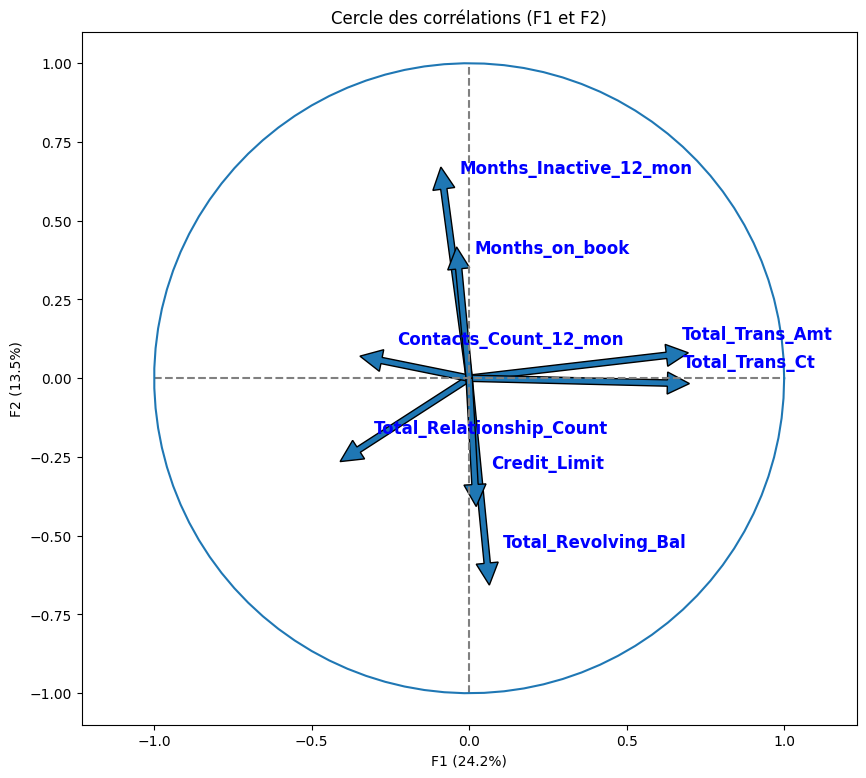

In [ ]:
#pour F1 et F2
x_y = (0,1)
x_y
correlation_graph(pca, x_y, colonnes_numeriques)

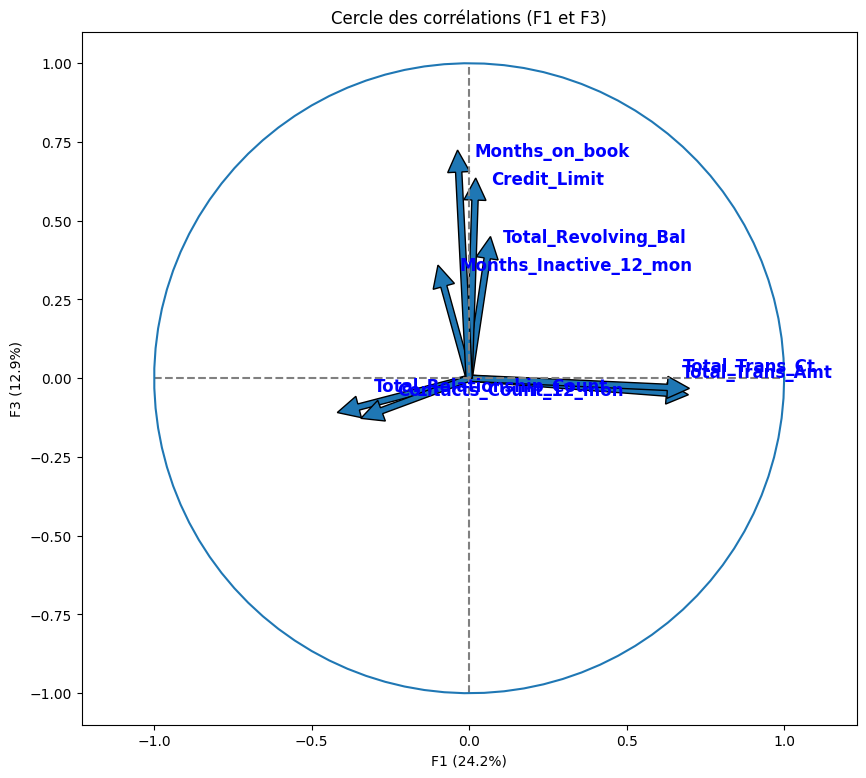

In [ ]:
#pour F1 et F3
x_y = (0,2)
x_y
correlation_graph(pca, x_y, colonnes_numeriques)

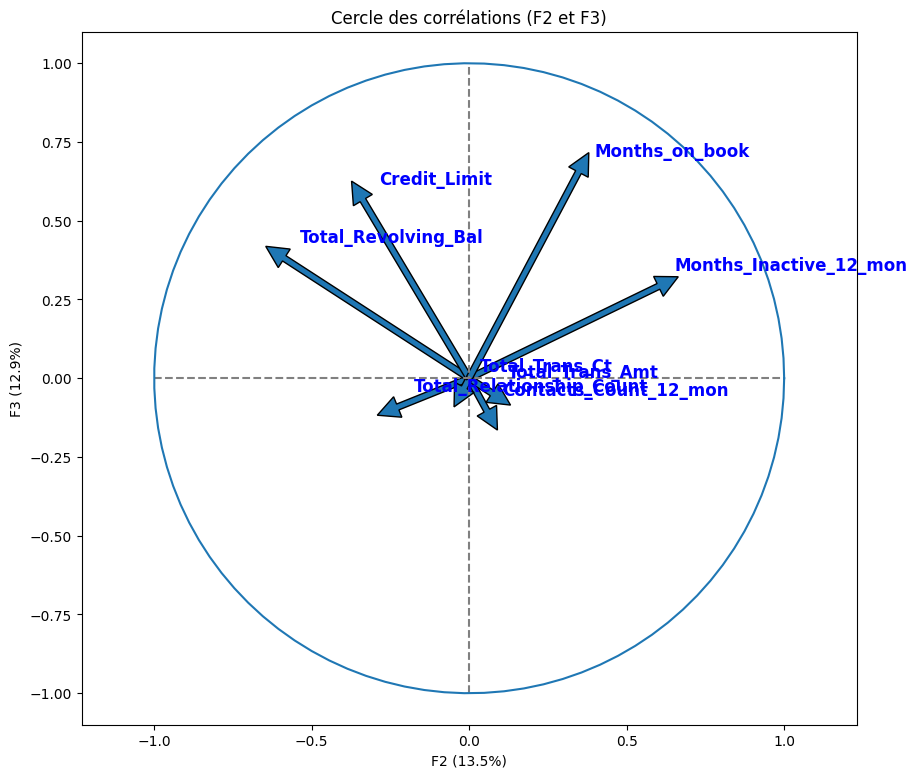

In [ ]:
#pour F2 et F3
x_y = (1,2)
x_y
correlation_graph(pca, x_y, colonnes_numeriques)

# 6. Modélisation prédictive

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import statsmodels.api as sm

In [ ]:
df['Attrition_Flag'] = (df['Attrition_Flag'] == "Attrited Customer").astype(int)

# Sélection des colonnes numériques et ajout d'une constante
data = df.select_dtypes(include=[np.number])

data = sm.add_constant(data)

# Partitionnement des données
proportion_entrainement = 0.7
data_entrainement, data_test = train_test_split(
    data,
    test_size=1-proportion_entrainement,
    random_state=123,  # Pour la reproductibilité
    stratify=data['Attrition_Flag']  # Stratifier par la colonne 'Attrition_Flag'
)


# Entraînement du modèle de régression logistique
X_train = data_entrainement.drop(columns=['Attrition_Flag'])
y_train = data_entrainement['Attrition_Flag']
X_test = data_test.drop(columns=['Attrition_Flag'])
y_test = data_test['Attrition_Flag']
modele_logistique = sm.Logit(y_train, X_train).fit()

# Affichage du résumé du modèle
print(modele_logistique.summary())

Optimization terminated successfully.
         Current function value: 0.258125
         Iterations 8
                           Logit Regression Results                           
Dep. Variable:         Attrition_Flag   No. Observations:                 7088
Model:                          Logit   Df Residuals:                     7073
Method:                           MLE   Df Model:                           14
Date:                Tue, 13 May 2025   Pseudo R-squ.:                  0.4144
Time:                        13:47:27   Log-Likelihood:                -1829.6
converged:                       True   LL-Null:                       -3124.5
Covariance Type:            nonrobust   LLR p-value:                     0.000
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                        4.4189      0.445      9.941      0.000       3.548

In [ ]:
# Supposons que modele_logistique est déjà entraîné, comme ceci:
# modele_logistique = sm.Logit(y, X).fit()

# Obtenir les coefficients estimés du modèle
coefficients = modele_logistique.params

# Calculer les rapports de cotes en exponentiant les coefficients
odds_ratios = np.exp(coefficients)

# Créer un DataFrame avec les noms des variables et leurs rapports de cotes
variables = coefficients.index
tableau_odds_ratios = pd.DataFrame({'Variable': variables, 'OddsRatio': odds_ratios})

# Afficher le tableau des rapports de cotes
print(tableau_odds_ratios)

                                          Variable  OddsRatio
const                                        const  83.007691
Customer_Age                          Customer_Age   1.002921
Dependent_count                    Dependent_count   1.121988
Months_on_book                      Months_on_book   0.985664
Total_Relationship_Count  Total_Relationship_Count   0.658937
Months_Inactive_12_mon      Months_Inactive_12_mon   1.927381
Contacts_Count_12_mon        Contacts_Count_12_mon   1.336347
Credit_Limit                          Credit_Limit   1.000024
Total_Revolving_Bal            Total_Revolving_Bal   0.999051
Avg_Open_To_Buy                    Avg_Open_To_Buy   0.999941
Total_Amt_Chng_Q4_Q1          Total_Amt_Chng_Q4_Q1   1.501571
Total_Trans_Amt                    Total_Trans_Amt   1.000643
Total_Trans_Ct                      Total_Trans_Ct   0.899738
Total_Ct_Chng_Q4_Q1            Total_Ct_Chng_Q4_Q1   0.038059
Avg_Utilization_Ratio        Avg_Utilization_Ratio   0.726991


Optimization terminated successfully.
         Current function value: 0.239221
         Iterations 8


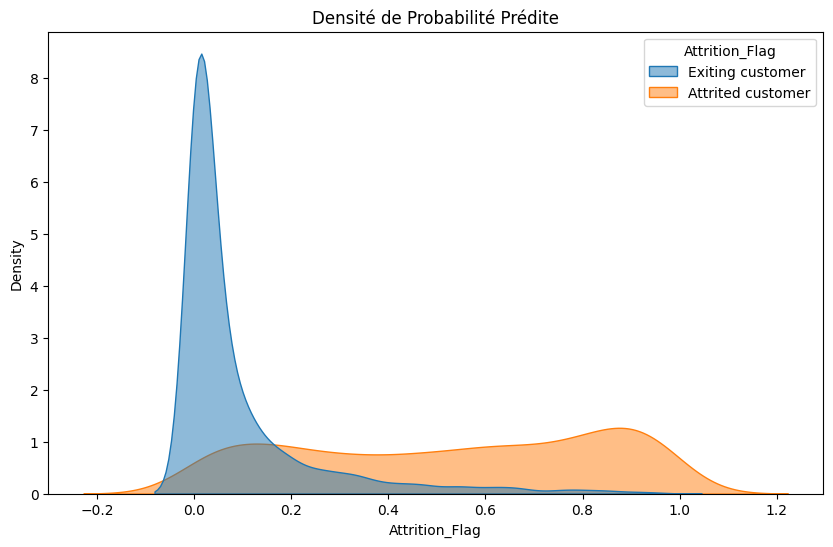

                                          Variable  OddsRatio
const                                        const  83.007691
Customer_Age                          Customer_Age   1.002921
Dependent_count                    Dependent_count   1.121988
Months_on_book                      Months_on_book   0.985664
Total_Relationship_Count  Total_Relationship_Count   0.658937
Months_Inactive_12_mon      Months_Inactive_12_mon   1.927381
Contacts_Count_12_mon        Contacts_Count_12_mon   1.336347
Credit_Limit                          Credit_Limit   1.000024
Total_Revolving_Bal            Total_Revolving_Bal   0.999051
Avg_Open_To_Buy                    Avg_Open_To_Buy   0.999941
Total_Amt_Chng_Q4_Q1          Total_Amt_Chng_Q4_Q1   1.501571
Total_Trans_Amt                    Total_Trans_Amt   1.000643
Total_Trans_Ct                      Total_Trans_Ct   0.899738
Total_Ct_Chng_Q4_Q1            Total_Ct_Chng_Q4_Q1   0.038059
Avg_Utilization_Ratio        Avg_Utilization_Ratio   0.726991


In [ ]:
# Evaluation et prediction
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.api import Logit
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.preprocessing import LabelEncoder

# Prédire les probabilités sur la base d'entraînement
modele_logistique = Logit(y_test, X_test).fit()
probas_train = modele_logistique.predict(X_train)  # X et y doivent être définis au préalable

# Créer un dataframe avec les probabilités prédites et les étiquettes de maladie cardiaque
predicted_data = pd.DataFrame({
    'Probabilite': probas_train,
    'Attrition_Flag': y_train  # 'y' doit être les étiquettes de votre maladie cardiaque
})

# Convertir les étiquettes d'attrition en facteurs lisibles
predicted_data['Attrition_Flag'] = predicted_data['Attrition_Flag'].map({0: 'Exiting customer', 1: 'Attrited customer'})

# Créer un graphique de densité pour les Exiting customer et Attrited_customer
plt.figure(figsize=(10, 6))
sns.kdeplot(data=predicted_data, x='Probabilite', hue='Attrition_Flag', fill=True, common_norm=False, alpha=0.5)
plt.title('Densité de Probabilité Prédite')
plt.xlabel('Attrition_Flag')
plt.show()

# Prédire les classes en utilisant un seuil de probabilité de 0.5 pour la base d'entraînement
seuil = 0.18
predictions_train = np.where(probas_train>=seuil,1,0)

# Afficher le tableau des rapports de cotes
print(tableau_odds_ratios)


# 7. Classification des clients : k-means

   CLIENTNUM     Attrition_Flag  Customer_Age Gender  Dependent_count  \
0  768805383  Existing Customer            45      M                3   
1  818770008  Existing Customer            49      F                5   
2  713982108  Existing Customer            51      M                3   
3  769911858  Existing Customer            40      F                4   
4  709106358  Existing Customer            40      M                3   

  Education_Level Marital_Status Income_Category Card_Category  \
0     High School        Married     $60K - $80K          Blue   
1        Graduate         Single  Less than $40K          Blue   
2        Graduate        Married    $80K - $120K          Blue   
3     High School        Unknown  Less than $40K          Blue   
4      Uneducated        Married     $60K - $80K          Blue   

   Months_on_book  ...  Total_Revolving_Bal  Avg_Open_To_Buy  \
0              39  ...                  777          11914.0   
1              44  ...              

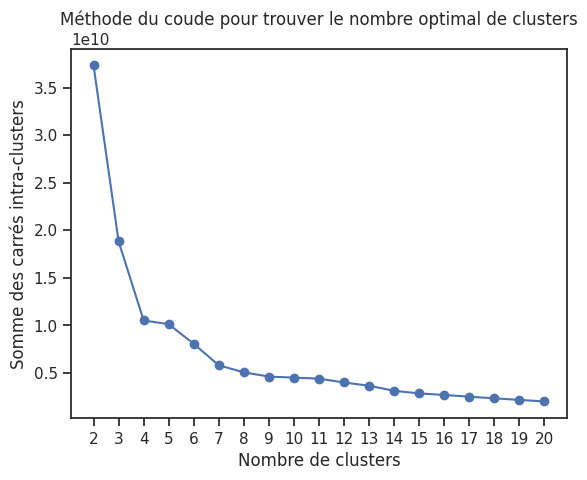

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

import numpy as np
import pandas as pd
from sklearn.cluster import KMeans

# Définir les variables pour le clustering
cluster_vars = df[["Total_Relationship_Count","Months_Inactive_12_mon", "Contacts_Count_12_mon", "Total_Revolving_Bal", "Total_Trans_Amt","Total_Trans_Ct"]]

# Définir une graine aléatoire pour la reproductibilité
np.random.seed(128)

# Utiliser K-means pour effectuer le clustering
kmeans = KMeans(n_clusters=3, random_state=42)  # Supposons 3 clusters pour l'exemple
kmeans.fit(cluster_vars)

# Ajouter les étiquettes de cluster au DataFrame original
df['Cluster'] = kmeans.labels_

# Afficher les premières lignes du DataFrame avec les étiquettes de cluster
print(df.head())

# Fonction pour calculer la somme totale des carrés au sein des clusters
def kmean_withinss(k):
    cluster = KMeans(n_clusters=k, random_state=42)
    cluster.fit(cluster_vars)
    return cluster.inertia_

# Exécuter l'algorithme sur une plage de valeurs de k
max_k = 20
wss = [kmean_withinss(k) for k in range(2, max_k+1)]

# Construire un dataframe pour stocker
elbow = pd.DataFrame({'K': range(2, max_k+1), 'WSS': wss})

# Afficher le dataframe pour voir les résultats
print(elbow)

# Tracer le coude (elbow) pour trouver le nombre optimal de clusters
plt.plot(elbow['K'], elbow['WSS'], marker='o')
plt.xlabel('Nombre de clusters')
plt.ylabel('Somme des carrés intra-clusters')
plt.title('Méthode du coude pour trouver le nombre optimal de clusters')
plt.xticks(range(2, max_k+1))
plt.show()

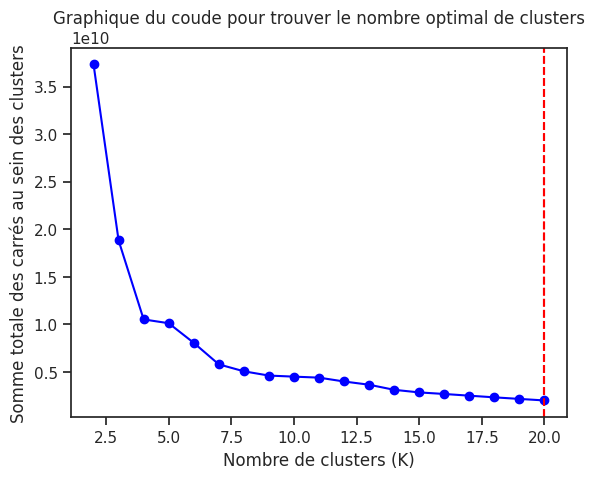

In [ ]:
# Tracer le graphique du coude avec une ligne verticale pour le nombre optimal de clusters
optimal_k = elbow.loc[elbow['WSS'].idxmin(), 'K']
plt.axvline(x=optimal_k, color='red', linestyle='--')  # Ajouter une ligne verticale pour le nombre optimal de clusters
plt.plot(elbow['K'], elbow['WSS'], marker='o', color='blue')
plt.xlabel('Nombre de clusters (K)')
plt.ylabel('Somme totale des carrés au sein des clusters')
plt.title('Graphique du coude pour trouver le nombre optimal de clusters')
plt.axvline(x=optimal_k, color='red', linestyle='--')  # Ajouter une ligne verticale pour le nombre optimal de clusters
plt.show()

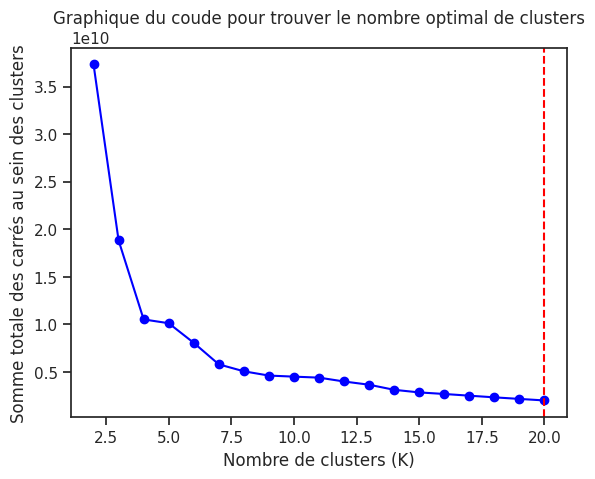

Clusters assignés : [14 14  4 ...  9  2 10]
Centres de cluster : [[4.16300366e+00 2.40659341e+00 2.74175824e+00 2.10533700e+03
  2.41390110e+03 5.12765568e+01]
 [2.36956522e+00 2.24637681e+00 2.19565217e+00 1.76532246e+03
  1.46712246e+04 1.09728261e+02]
 [2.20000000e+00 2.43448276e+00 2.55172414e+00 2.04917241e+02
  7.74813103e+03 7.89310345e+01]
 [3.82250580e+00 2.33294664e+00 2.17053364e+00 1.16967517e+03
  4.85443735e+03 7.81171694e+01]
 [3.76196319e+00 2.59509202e+00 2.97546012e+00 5.98760736e+01
  2.37275092e+03 4.69877301e+01]
 [1.96907216e+00 2.24054983e+00 1.98625430e+00 1.70812027e+03
  7.61669416e+03 8.60618557e+01]
 [4.26627219e+00 2.27416174e+00 2.43984221e+00 1.97554241e+01
  3.80124655e+03 7.02287968e+01]
 [4.19255319e+00 2.30744681e+00 2.32659574e+00 1.08457234e+03
  4.10453298e+03 7.32297872e+01]
 [3.68201754e+00 2.45614035e+00 2.69956140e+00 7.37017544e+01
  1.33955482e+03 3.19429825e+01]
 [2.96842105e+00 2.47368421e+00 2.86315789e+00 2.47263158e+02
  9.06689474e+03 7

In [ ]:
# Choisissez le nombre optimal de clusters (À partir du coude)
optimal_k = elbow.loc[elbow['WSS'].idxmin(), 'K']

# Tracer le graphique du coude avec une ligne verticale pour le nombre optimal de clusters
plt.plot(elbow['K'], elbow['WSS'], marker='o', color='blue')
plt.xlabel('Nombre de clusters (K)')
plt.ylabel('Somme totale des carrés au sein des clusters')
plt.title('Graphique du coude pour trouver le nombre optimal de clusters')
plt.axvline(x=optimal_k, color='red', linestyle='--')  # Ajouter une ligne verticale pour le nombre optimal de clusters
plt.show()

# Exécuter l'algorithme K-means avec le nombre optimal de clusters
kmeans_model = KMeans(n_clusters=optimal_k, random_state=42)
kmeans_model.fit(cluster_vars)

# Afficher les résultats
print("Clusters assignés :", kmeans_model.labels_)
print("Centres de cluster :", kmeans_model.cluster_centers_)
print("Taille de chaque cluster :", np.bincount(kmeans_model.labels_))

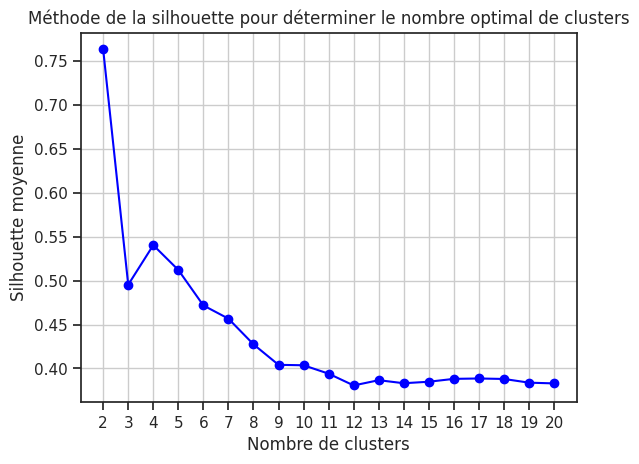

Le meilleur nombre de clusters est: 2


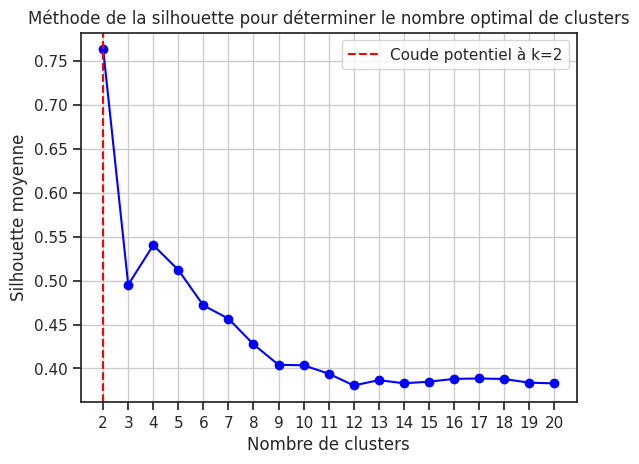

KMeans(n_clusters=2, n_init=42, random_state=42)


In [ ]:
from sklearn.metrics import silhouette_score

# Fonction pour calculer la silhouette moyenne
def calculate_avg_silhouette(data, num_clusters):
    silhouette_avg = []
    for k in num_clusters:
        kmeans_model = KMeans(n_clusters=k, n_init=42, random_state=42)
        cluster_assignments = kmeans_model.fit_predict(data)
        silhouette_avg.append(silhouette_score(data, cluster_assignments))
    return silhouette_avg

# Test de différentes valeurs de clusters
num_clusters = range(2, 21)  # Vous pouvez ajuster la plage selon votre besoin

# Calcul de la silhouette moyenne pour chaque nombre de clusters
silhouette_values = calculate_avg_silhouette(cluster_vars, num_clusters)

# Tracé du graphique pour la méthode de la silhouette
plt.plot(num_clusters, silhouette_values, marker='o', color='blue')
plt.xlabel('Nombre de clusters')
plt.ylabel('Silhouette moyenne')
plt.title('Méthode de la silhouette pour déterminer le nombre optimal de clusters')
plt.xticks(num_clusters)
plt.grid(True)
plt.show()

# Silhouette du meilleur nombre de clusters
best_num_clusters = num_clusters[np.argmax(silhouette_values)]
print("Le meilleur nombre de clusters est:", best_num_clusters)

# Exécuter l'algorithme K-means sur le meilleur nombre de clusters
kmeans_model = KMeans(n_clusters=best_num_clusters, n_init=42, random_state=42)
kmeans_model.fit(cluster_vars)

# Tracer une ligne verticale pour le meilleur nombre de clusters
plt.plot(num_clusters, silhouette_values, marker='o', color='blue')
plt.axvline(x=best_num_clusters, color='red', linestyle='--', label=f'Coude potentiel à k={best_num_clusters}')
plt.xlabel('Nombre de clusters')
plt.ylabel('Silhouette moyenne')
plt.title('Méthode de la silhouette pour déterminer le nombre optimal de clusters')
plt.xticks(num_clusters)
plt.grid(True)
plt.legend()
plt.show()

# Afficher les résultats de la classification
print(kmeans_model)

## 7. Visualisation Visualisation des résultats de la classification - Visualisation en 2D des clusters créés par k-means

<ipython-input-161-3a871286a2bb>:18: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


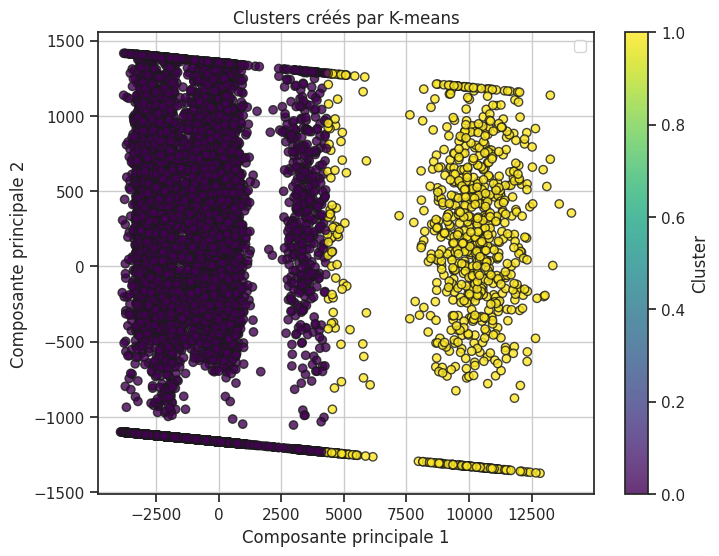

In [ ]:
# Définir une fonction pour la visualisation des clusters en 2D
def visualize_clusters_2d(data, labels, title):
    # Convertir les données DataFrame en tableau NumPy
    data_array = data.to_numpy()

    # Réduction de dimension avec PCA à 2 composantes
    pca = PCA(n_components=2)
    pca_data = pca.fit_transform(data_array)

    # Tracer les clusters
    plt.figure(figsize=(8, 6))
    plt.scatter(pca_data[:, 0], pca_data[:, 1], c=labels, cmap='viridis', edgecolor='k', alpha=0.8)
    plt.title(title)
    plt.xlabel('Composante principale 1')
    plt.ylabel('Composante principale 2')
    plt.colorbar(label='Cluster')
    plt.grid(True)
    plt.show()

# Visualisation en 2D des clusters créés par k-means
visualize_clusters_2d(cluster_vars, kmeans_model.labels_, 'Clusters créés par K-means')


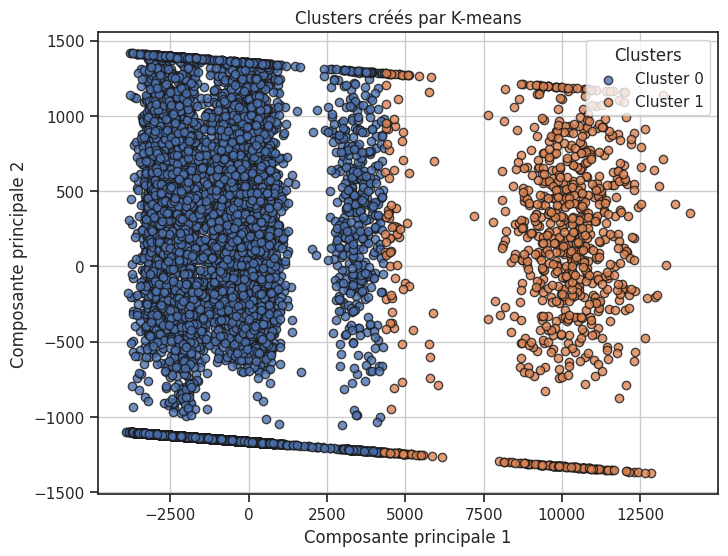

In [ ]:
# Définir une fonction pour la visualisation des clusters en 2D avec légende
def visualize_clusters_2d(data, labels, title):
    # Convertir les données DataFrame en tableau NumPy
    data_array = data.to_numpy()

    # Réduction de dimension avec PCA à 2 composantes
    pca = PCA(n_components=2)
    pca_data = pca.fit_transform(data_array)

    # Tracer les clusters un par un pour avoir une légende claire
    plt.figure(figsize=(8, 6))
    unique_labels = np.unique(labels)

    for label in unique_labels:
        cluster_points = pca_data[labels == label]
        plt.scatter(cluster_points[:, 0], cluster_points[:, 1],
                    label=f"Cluster {label}", edgecolor='k', alpha=0.8)

    # Ajouts esthétiques
    plt.title(title)
    plt.xlabel('Composante principale 1')
    plt.ylabel('Composante principale 2')
    plt.legend(title="Clusters")
    plt.grid(True)
    plt.show()

# Visualisation en 2D des clusters créés par k-means
visualize_clusters_2d(cluster_vars, kmeans_model.labels_, 'Clusters créés par K-means')